<a href="https://colab.research.google.com/github/Himisha-Gupta/dog-breed-identification/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to End Multi Class Dog Breed Classification
This notebook builds an end to end multi class image classifier using Tensorflow 2.0 and Tensorflow hub
## 1. Problem
Identifying the breed of dog given an image of a dog.
## 2. Data
The data used is from "https://www.kaggle.com/c/dog-breed-identification/data"
## 3. Evalution
The evalution is a file with a prediction probablities for each dog breed of a test image
## 4. Features
Information about data:
1. Unstructured data (images)
2. The dataset comprises 120 breeds of dogs.Therefore we are using multi class classifcation
3. There are around 10000+ images in training set (These images have labels)
3. There are around 10000+ images in testing set (These images have no labels)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Unzipping and uploading data
#!unzip "/content/drive/MyDrive/dog vision/dog-breed-identification (1).zip" -d "/content/drive/MyDrive/dog vision"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Getting our workspace ready
1. Importing tensorflow
2. Importing tensorflow hub
3. Make sure we are using a GPU

In [ ]:

# Import Necessary tools
import tensorflow as tf
import tensorflow_hub as hub

print(tf.__version__)
print(hub.__version__)

# Check for GPU availability
print("GPU" , "Available (YESS)" if tf.config.list_physical_devices("GPU") else "not available")

2.15.0
0.16.1
GPU Available (YESS)


## Getting a data ready and turning into tensors(numerical representations)
Lest start by accessing our data and checking out the labels

In [ ]:
import pandas as pd


In [ ]:
labels_csv = pd.read_csv("/content/drive/MyDrive/dog vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head(20))

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                  id                    breed
0   000bec180eb18c7604dcecc8fe0dba07              boston_bull
1   001513dfcb2ffafc82cccf4d8bbaba97                    dingo
2   001cdf01b096e06d78e9e5112d419397                 pekinese
3   00214f311d5d2247d5dfe4fe24b2303d                 bluetick
4   0021f9ceb3235effd7fcde7f7538ed62         golden_retriever
5   002211c81b498ef88e1b40b9abf84e1d       bedlington_terrier
6   00290d3e1fdd27226ba27a8ce248ce85       bedlington_terrier
7   002a283a315af96eaea0e28e7163b21b                   borzoi
8   003df8b8a8b05244b1d920bb6cf451f9                  basenji
9   0042188c895a2f14ef64a918ed9c7b64       scottish_deerhound
10  004396df1

In [ ]:
# How many values are there of each breedd?



<Axes: >

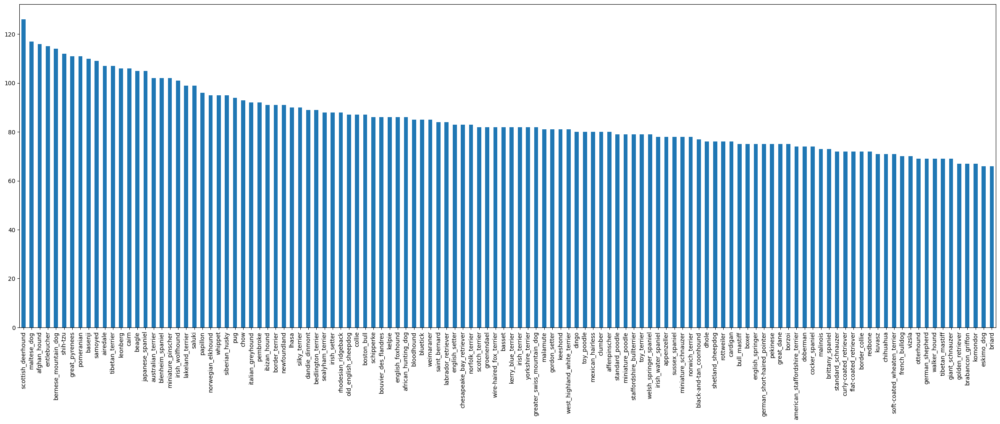

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize = (30,10))

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

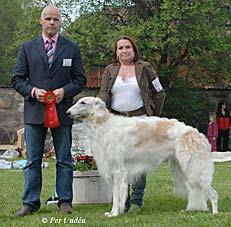

In [ ]:
# Lets view an image
#!pip install IPython


from IPython.display import Image
Image("/content/drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg")

In [ ]:

labels_csv.head(20)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


In [ ]:
filenames = ["/content/drive/MyDrive/dog vision/train/"+ fnames +".jpg" for fnames in labels_csv["id"]]



In [ ]:

len(filenames)

10222

In [ ]:
# Check whether number of filename matches number of actual image files

In [ ]:
import os
if len(os.listdir("/content/drive/MyDrive/dog vision/train")) == len(filenames):
  print("Equal")
else:
  print("Not equal")

Equal


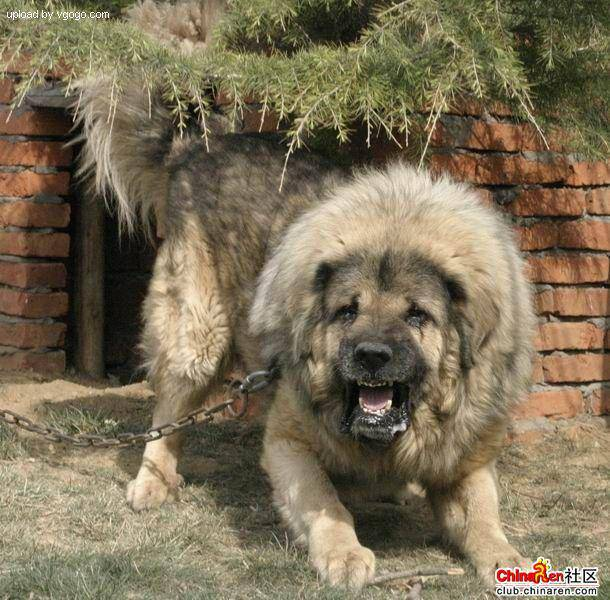

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Prepaer our labels

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)

In [ ]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

See if number of labels matches the nuumber of filenames

In [ ]:
if len(filenames) == len(labels):
  print("Equal")
else:
  print("Not equal")

Equal


In [ ]:
#  Find the unique label values

unique_breeds = np.unique(labels)
print(unique_breeds)


['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

In [ ]:
len(unique_breeds)

120

In [ ]:
#BOOLEAN LABELS = LABELS INTO NUMERIC FORMAT
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['/content/drive/MyDrive/dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own validation set
Since the dataset from kaggle doesnt come with a validation set we are  going to create our own validation set

In [ ]:
# Set up X and y variables
X = filenames
y= boolean_labels

We are going to start off experimenting with ~1000 images and ncrese as needed

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider" , min:1000 , max:10000, step:100}

In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into tarining and validation of total size NUM_IMAGES
X_train , X_val , y_train , y_val = train_test_split(X[:NUM_IMAGES],
                                                     y[:NUM_IMAGES],
                                                     test_size= 0.2,
                                                     random_state=42)
len(X_train) , len(X_val), len(y_train), len(y_val)


(800, 200, 800, 200)

In [ ]:
X_train[:5] , y_train[:2]



(['/content/drive/MyDrive/dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing images (Turning images into tensors)
To preprocess our images into Tensors we are going to write a function which does a few things:
1. Takes an image filename as input.
2. Uses TensorFlow to read the file and save it to a variable, image.
3. Turn our image (a jpeg file) into Tensors.
4. Convert the color channel values from 0-255 to 0-1 values (normalization)
4. Resize the image to be of shape (224, 224).
5. Return the modified image.


In [ ]:
#  Convert image to Numpy array
from matplotlib.pyplot import imread

In [ ]:
image = (imread(filenames[42]))

In [ ]:
image.shape

(257, 350, 3)

In [ ]:
# Trun image into tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

In [ ]:


# Defining image size
IMG_SIZE = 224

# Function for preprocess images

def process_image(image_path, img_size = IMG_SIZE):
  """
  Takes and image file path and turns the image into a tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpeg image into numerical tensor with 3 color channel
  image = tf.image.decode_jpeg(image , channels=3)

  # Convert the color channel values from 0-255 to 0-1 values (normalization)
  image = tf.image.convert_image_dtype(image, tf.float32)

  # Resize the image to be of shape (224, 224).
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image


In [ ]:
process_image(filenames[2])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3918853 , 0.3918853 , 0.36051273],
        [0.43775532, 0.43775532, 0.40638277],
        [0.44351017, 0.44351017, 0.41213763],
        ...,
        [0.05796662, 0.02239764, 0.01937653],
        [0.05252095, 0.0470589 , 0.04978992],
        [0.04586835, 0.05371149, 0.04978992]],

       [[0.38653433, 0.38261276, 0.3630049 ],
        [0.4161569 , 0.41223532, 0.39262748],
        [0.43315482, 0.42923325, 0.4096254 ],
        ...,
        [0.0909924 , 0.05177672, 0.04754004],
        [0.03035708, 0.02489503, 0.02762605],
        [0.02370449, 0.03154762, 0.02762605]],

       [[0.36859885, 0.36467728, 0.34506944],
        [0.35422263, 0.35030106, 0.33069322],
        [0.39899355, 0.39507198, 0.3754641 ],
        ...,
        [0.2361781 , 0.20233706, 0.19541305],
        [0.04896353, 0.04268564, 0.04582458],
        [0.04459034, 0.04705883, 0.04582458]],

       ...,

       [[0.7591447 , 0.75522316, 0.7356153 ],
        [0.74

## Turning data into batches

We turn our data into batches to fit into memory perfectly.

To use tensorflow effectively we need our data in form of tensor tuples which looks like this:
`(image , label)`

In [ ]:

# Create a functionto return a tuple (image , label)
def get_image_label(image_path , label):
  """Takes an image file path name and associated label , processes the image and returns a type of (image , label) """
  image = process_image(image_path)
  return image ,label

In [ ]:
(process_image(X[42] , tf.constant(y[42])))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

In [ ]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels

    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out different attributes of our data batch
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches


In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images , labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 24 (for displaying 25 images)
  for i in range (25):
    # Create subplots (5rows, 5cols)
    ax = plt.subplot(5 , 5, i+1)
    plt.subplots_adjust(wspace=1, hspace=1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")



In [ ]:
train_images , train_labels = next(train_data.as_numpy_iterator())

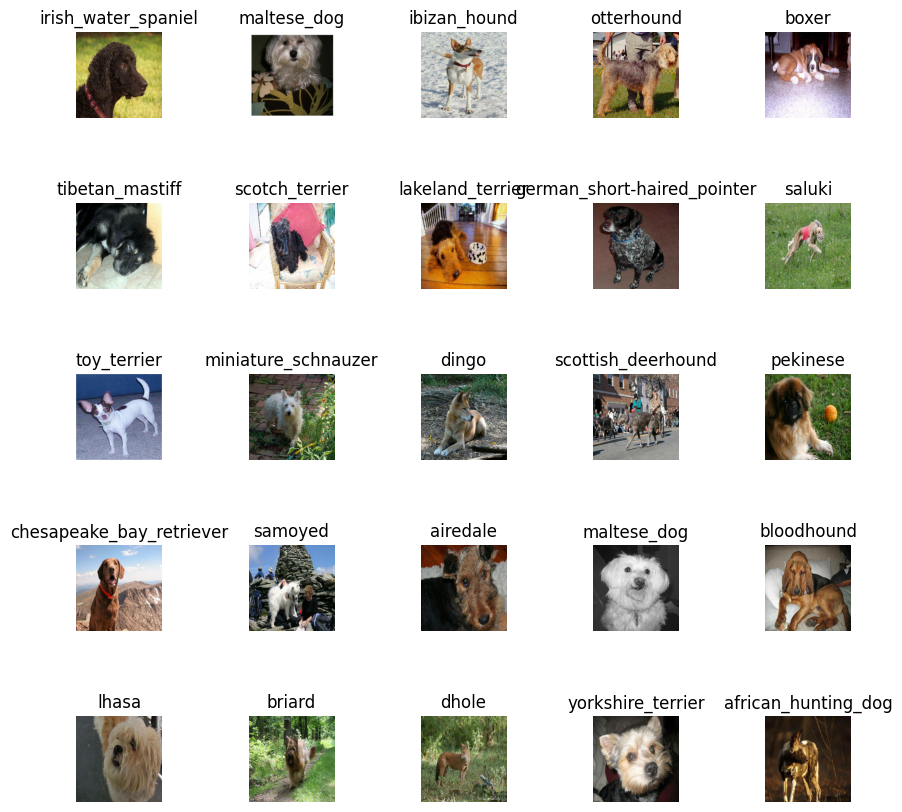

In [ ]:

show_25_images(train_images , train_labels)

In [ ]:
val_images , val_labels = next(val_data.as_numpy_iterator())

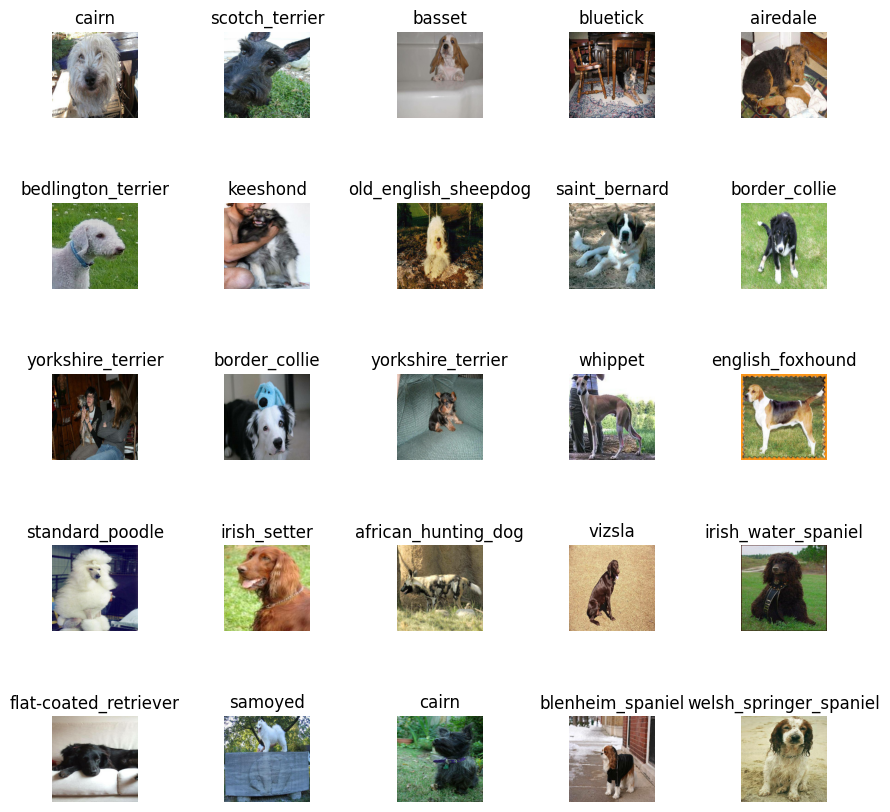

In [ ]:
show_25_images(val_images , val_labels)


## Building a model

Using a transfer learning.
Before building a model we need to define a few things:
* The input shape (our image shape,in form of tensors) to our model
* The output shape (our image shape,in form of tensors) of our model
* The URL of model we want to use (from tensorflow hub)
https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true



In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None , IMG_SIZE ,IMG_SIZE , 3 ] # Batch , height , width , color channels

# Setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model url from tensorflow hub
MODEL_URL= "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"


We have input, outputs and model.
Putting them into a keras deep learning model

creating a fucntion which:
* Takes the input shape, output shape , and the model we have chosen as parameter.
* Degine the layers in keras model in sequential process
* Compiles the model (it should be evaluated and improved)
* Build the model (tells the model the input shape it will be getting)
* Returns the model

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), #   "Here's how we'll measure how wrong you are (loss)."
      optimizer=tf.keras.optimizers.Adam(), # "Here's the smart guide that will help you learn and improve (optimizer)."
      metrics=["accuracy"] # "And, by the way, we really care about getting things right, so keep track of how often you do (accuracy)."
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating a callbacks

Callbacks are  helper functions a model can use during training to do such things as it save its progress , check its progress or stop training early if model stops improving

2 Callbacks~
* For TensorBoard which helps track our models progress
* For early stopping which prevents our model from training too long

## TensorBoard CallBack

To setup a tensorflow callback we need to do 3 things
1. Load the TensorBoard notebook extension
2. Create a tensorboard callbackk which is able to save logs to a directory and pass it to our model's `fit()` fucntion.
3. Visualize ouur model training logs with the `%tensorboard` magic fucntion (done after model training)





In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# Create a fucntion to build a Tensorboard Callback
def create_tensorboard_callback():
  # Create a log directoryfor storing tensorboard log
  logdir = os.path.join("/content/drive/MyDrive/dog vision/logs" ,
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

#### Early Stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [ ]:
# Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_accuracy',

    patience=3,

)

## Training a model (on subset of data)
Our first model is only going to train on 1000 images to make sure everything is working

In [ ]:
NUM_EPOCHS = 100 #@param {type: "slider" , min:10 , max: 100, step:10}
# Number of chances we will give our model to look into training set and then after practicing on a validation set


In [ ]:
print("GPU" , "Available (YESS)" if tf.config.list_physical_devices("GPU") else "not available")

GPU Available (YESS)


Create a function that trains a model
* Create a model using `create_model()`
* Set up a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` fucntion on our model passing it the training data , validation data , number of epochs to train for (`NUM_EPOCHS`) and the callbacks we would like to use
* Return the model


In [ ]:
def train_model():
  """
  Trains a given model and returns the trained version
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data ,
            epochs = NUM_EPOCHS ,
            validation_data = val_data,
            validation_freq=1,
            callbacks = [tensorboard , early_stopping])
  # Return The model
  return model


In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 205s 7s/step - loss: 4.5568 - accuracy: 0.1025 - val_loss: 3.3566 - val_accuracy: 0.2500
Epoch 2/100
25/25 [==============================] - 4s 139ms/step - loss: 1.6523 - accuracy: 0.6837 - val_loss: 2.1525 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 163ms/step - loss: 0.5750 - accuracy: 0.9425 - val_loss: 1.6569 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 5s 203ms/step - loss: 0.2536 - accuracy: 0.9900 - val_loss: 1.4918 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 4s 179ms/step - loss: 0.1481 - accuracy: 0.9962 - val_loss: 1.4204 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 3s 137ms/step - loss: 0.1021 - accuracy: 1.0000 - val_loss: 1.3774 - val_accuracy: 0.6450
Epoch 7/

### Checking the TensorBoard logs

The tensorboard magic fucntion (`%tensorboard`) will access the logs directory we created earlier and visualize its contents  

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [ ]:
# make predictions on the validations
predictions = model.predict(val_data , verbose = 1)
predictions.shape

7/7 [==============================] - 2s 117ms/step


(200, 120)

In [ ]:
len(y_val) , len(unique_breeds)

(200, 120)

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label


[4.55546193e-03 3.85515596e-05 6.96521485e-04 5.18794659e-05
 2.26328375e-05 1.92454427e-05 9.52395648e-02 4.98393783e-04
 1.84980265e-04 3.97110707e-04 6.15139259e-04 2.24026779e-04
 4.09924891e-04 7.53183940e-06 1.74167231e-04 3.37812700e-04
 9.70297242e-06 3.47276092e-01 1.52390130e-05 6.26489200e-05
 1.36948918e-04 2.69793964e-04 1.43570851e-05 3.30633193e-04
 1.37927163e-05 1.98765949e-04 2.47812271e-01 6.42074228e-05
 4.81723619e-05 1.15618896e-04 1.07445463e-03 2.42381706e-04
 7.94276348e-05 2.48918950e-05 1.15483788e-04 1.18183801e-02
 9.13294571e-06 1.28333486e-04 1.25654202e-04 8.06780517e-05
 3.34605254e-04 3.88206608e-05 9.53709023e-05 1.08333763e-04
 5.40714473e-06 6.33362288e-05 3.75345953e-05 2.58615444e-04
 1.55964386e-04 3.88972658e-05 4.00685494e-05 3.17755839e-05
 3.81338119e-04 2.05796623e-05 2.01627245e-05 2.43297196e-04
 1.63901408e-04 1.70248142e-03 2.44421739e-04 4.35741730e-02
 1.43527459e-05 1.20757059e-05 1.60744530e-03 6.47457273e-06
 9.38880185e-05 7.685828

In [ ]:
unique_breeds[0]

'affenpinscher'

Prediction probabilities are also knowns as confidence levels.


In [ ]:
# Turn prediction probability into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilites into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction_probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'brittany_spaniel'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is tsill in batch dataset , we will have to unbatch it to make predictions on validation images and then compare those predictions into validation labels (truth labels)

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):

  """
  Takes a batched dataset of (image , label) Tensors and returns sepertae arrays of iamges and labels.
  """

  images = []
  labels =[]
 #Loop through unbatced data
  for image , label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images ,labels

# Unbatchify the validation data
val_images , val_labels = unbatchify(val_data)
val_images[0] , val_labels[0]




(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(val_images[0]) , get_pred_label(val_labels[0])

('vizsla', 'affenpinscher')

To make Prediction labels , Validation Lables and Validation images more visual , lets create a function

Creating a fucntion that
* Takes an array of prediction probabilties  , an array of truth labels and an array of integer and images
* Convert the prediction probabilites to a predicted label.
*  Plot the predicted label , its predicted probabiltiy , the truth label and target image on single plot.


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

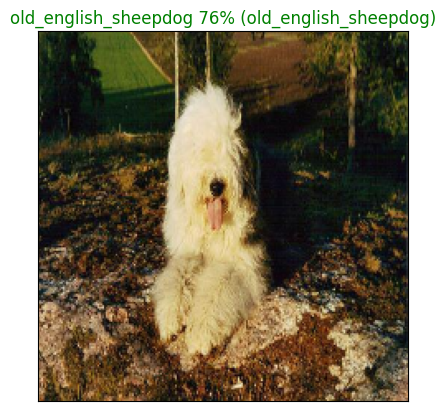

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=7)


Now we will create a fucntion to see the top 10 predictions. This fucncton will:
* Take an input of prediction probabilities array, an ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Predicition probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels , colouring the true label green

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass



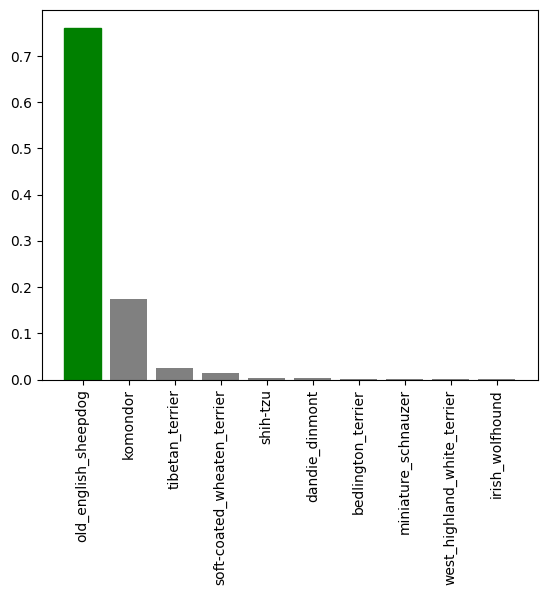

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=7)

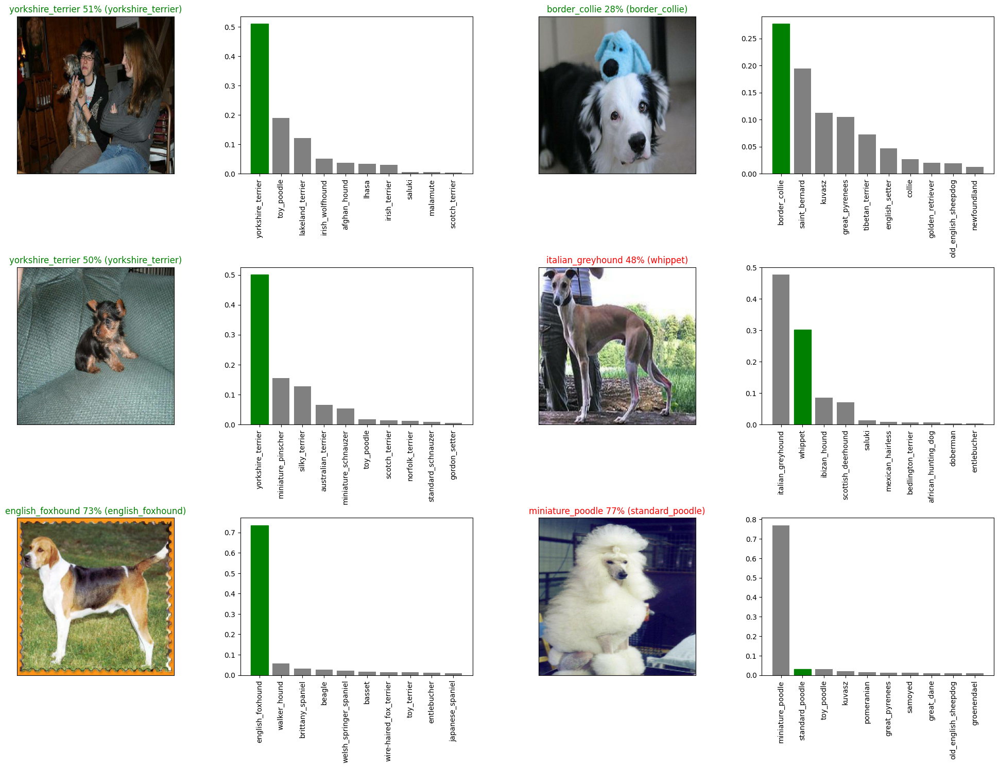

In [ ]:
# Checking out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols , 5 * num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2* num_cols , 2* i+1)
  plot_pred(prediction_probabilities=predictions,
            labels = val_labels,
            images = val_images ,
            n = i + i_multiplier)
  plt.subplot(num_rows , 2* num_cols , 2* i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels = val_labels,
                 n = i + i_multiplier
                 )
plt.tight_layout(h_pad= 1.0)
plt.show()

## Saving and Loading a model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Data/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# save_model(model, suffix="1000-images-mobilenetv2-Adam-2")

In [ ]:
model_1000_images = load_model('drive/My Drive/Data/models/20240128-15521706457140-1000-images-mobilenetv2-Adam-2.h5')

Loading saved model from: drive/My Drive/Data/models/20240128-15521706457140-1000-images-mobilenetv2-Adam-2.h5


In [ ]:
# Evaluate the pre daved model
model.evaluate(val_data)

7/7 [==============================] - 1s 98ms/step - loss: 1.2515 - accuracy: 0.7150


[1.2515442371368408, 0.7149999737739563]

In [ ]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 2s 158ms/step - loss: 1.2617 - accuracy: 0.6600


[1.2617292404174805, 0.6600000262260437]

## Training a model on full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X , y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

In [ ]:
# No validation set when trainingon all the data  , so we cant monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience= 3)

In [ ]:
# # Fit the full model to full data
# full_model.fit(x = full_data,
#                epochs = NUM_EPOCHS,
#                callbacks = [full_model_tensorboard , full_model_early_stopping])

In [ ]:
# Save model to file
# save_model(full_model, suffix="all-images-Adam")

In [ ]:

loded_full_model = load_model('drive/My Drive/Data/models/20240128-16181706458732-all-images-Adam.h5')



Loading saved model from: drive/My Drive/Data/models/20240128-16181706458732-all-images-Adam.h5


## Making predictions on test dataset

Sincce oure model is trained on images in form of Tensor batches , to make predictions on test data , we will have to get it into smae format.

`create_data_batches()`

To make predictions on test data we will:
* Get the test image filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test-data` parameter t True (since teh test data doesnt have labels.)
* Make predictions array by passing the test batches to the `predict()` method called on our model.


In [ ]:
test_path = "/content/drive/MyDrive/dog vision/test/"
test_filenames =[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/dog vision/test/e6353a9420e1e529b6c20b9414786ae7.jpg',
 '/content/drive/MyDrive/dog vision/test/e421e13d0d4c977ab89fa9965221809c.jpg',
 '/content/drive/MyDrive/dog vision/test/e4819d4934cad3c74896ebbf60df595a.jpg',
 '/content/drive/MyDrive/dog vision/test/ddf2401701ee374c0f1f9dd607071ec7.jpg',
 '/content/drive/MyDrive/dog vision/test/e3d417026b89cbb57b00a7208421009d.jpg',
 '/content/drive/MyDrive/dog vision/test/e3cec8d0c1876ac36942d35f64b9dfa0.jpg',
 '/content/drive/MyDrive/dog vision/test/e07106e5301fbce05cade5c94f775a72.jpg',
 '/content/drive/MyDrive/dog vision/test/e17512584de423da7fc17bfb2c7548ae.jpg',
 '/content/drive/MyDrive/dog vision/test/e3a7aeb038b8abd3f8ed910c84504efc.jpg',
 '/content/drive/MyDrive/dog vision/test/e70dfb4bf50f74850463cfd35edc8af5.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batches
test_data = create_data_batches(test_filenames , test_data= True)

Creating test data batches...


In [ ]:
test_data


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# # Make predictions on test data batches using the loaded full model
# test_predictions = loded_full_model.predict(test_data , verbose =1)

In [ ]:
# np.savetxt("/content/drive/MyDrive/dog vision/preds_array.csv" , test_predictions , delimiter=",")

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/dog vision/preds_array.csv" ,delimiter=",")

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle
Output in a dataframe with an ID  and a colum for each different dog breed
To get the data in this format, we will:
* Create a pandas DataFrame with an ID column as well as column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probaabilty)to each of the dog breed columns.
* Export the dataframe as a CSV to submit it to Kaggle

In [ ]:
# Create a pandas dataframe with empty colums
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [ ]:
# Append test image ID's to predictions DataFrame
test_path ="/content/drive/MyDrive/dog vision/test"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6353a9420e1e529b6c20b9414786ae7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e421e13d0d4c977ab89fa9965221809c,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e4819d4934cad3c74896ebbf60df595a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ddf2401701ee374c0f1f9dd607071ec7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e3d417026b89cbb57b00a7208421009d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6353a9420e1e529b6c20b9414786ae7,8.952938e-11,1.888319e-10,2.895190e-11,3.728567e-08,2.952329e-07,2.282947e-08,1.493684e-09,6.067638e-09,6.126278e-07,...,7.024133e-11,2.004044e-11,4.981781e-04,1.516677e-05,5.632121e-08,7.456507e-09,1.338524e-12,1.299786e-07,2.060226e-08,1.418129e-10
1,e421e13d0d4c977ab89fa9965221809c,1.742509e-13,9.399380e-10,8.227963e-08,2.929211e-10,4.647691e-10,2.805975e-10,2.625449e-09,1.527888e-07,3.110907e-07,...,9.082044e-08,2.215135e-08,4.173717e-11,1.819125e-10,7.828979e-10,2.727016e-09,3.246696e-11,7.225987e-09,8.925507e-09,6.052734e-13
2,e4819d4934cad3c74896ebbf60df595a,4.215988e-10,1.264255e-10,4.546975e-11,2.328966e-09,5.188837e-08,3.704897e-10,4.776238e-10,1.799492e-11,1.112799e-08,...,5.537655e-08,6.810204e-10,5.178902e-11,2.988671e-10,3.735823e-09,1.504320e-08,3.191322e-06,1.786818e-07,7.305343e-04,2.700891e-09
3,ddf2401701ee374c0f1f9dd607071ec7,1.002612e-06,4.288912e-07,1.247055e-08,7.191585e-08,3.935051e-09,2.020301e-07,1.063515e-09,2.701296e-09,3.310946e-10,...,1.581045e-06,7.119874e-09,7.443908e-09,1.804452e-09,7.933179e-09,2.413071e-10,7.691392e-08,2.846465e-07,2.005217e-07,1.450209e-04
4,e3d417026b89cbb57b00a7208421009d,3.679353e-07,3.164927e-05,2.334529e-06,1.681096e-07,1.989673e-06,1.404361e-05,6.644066e-07,1.441827e-04,5.093753e-06,...,3.341404e-07,4.456429e-06,8.384458e-07,2.073576e-05,2.592241e-06,1.227515e-06,3.810143e-06,3.271701e-07,8.438413e-05,1.278699e-06


In [ ]:
# Save our prediction dataframe to CSV for submission to kaggle
preds_df.to_csv("drive/My Drive/Data/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

## Making predictions on Custom Images
To make prediction on our own images:
* Get the filepaths of our own images.
*Turn the filepaths into data batches using create_data_batches(). And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.

In [ ]:
custom_path = "/content/drive/MyDrive/dog vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [ ]:
# Make predictions on the custom data
custom_preds = loded_full_model.predict(custom_data)

1/1 [==============================] - 1s 691ms/step


In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['miniature_poodle']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

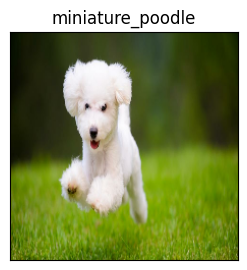

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)

In [ ]:
!pip install anvil-uplink

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.1/90.1 kB 800.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.4/51.4 kB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ws4py: filename=ws4py-0.5.1-py3-none-any.whl size=45228 sha256=a0a47a6b1ec619b90ae2d974dc6939a291411ff020695b203ef714bf618a0186
  Stored in directory: /root/.cache/pip/wheels/2e/7c/ad/d9c746276bf024d44296340869fcb169f1e5d80fb147351a57
Successfully built ws4py
